Name: Ronish Shrestha

University Id:2408383

**Part 1: Building and Evaluating Convolutional Neural Networks from Scratch**

This section centers on creating and assessing CNN models from scratch for classifying brain tumors using MRI scans. A basic CNN model and a more advanced architecture incorporating regularization techniques are implemented and compared. Various optimizers and design configurations are examined through metrics such as accuracy, precision, recall, and F1-score to evaluate learning performance, generalization capability, and overfitting tendencies.

In [11]:
# Connect to Google Drive storage
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [24]:
import os
import zipfile

In [12]:
# Location of compressed dataset file
zip_path = "/content/drive/MyDrive/AiFinalYear/Brain Tumor Classifcation FinalYear.zip"

In [13]:
# Target directory for extracted files
extract_path = "/content/brain_tumor_dataset"


In [26]:

# Generate extraction directory if it doesn't exist
os.makedirs(extract_path, exist_ok=True)

In [27]:

# Extract compressed dataset archive
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")
print(f"Dataset location: {extract_path}")

Dataset extracted successfully!
Dataset location: /content/brain_tumor_dataset


In [25]:
print("\nFolders inside dataset:\n")

for item in os.listdir(extract_path):
    print(item)


Folders inside dataset:

Brain Tumor Classifcation


# Load required libraries

In [28]:
# Load modules for filesystem operations and directory management
import os
import random
import hashlib

# Load packages for numerical operations and data manipulation
import numpy as np
import pandas as pd

# Load plotting tools for data visualization and analysis
import matplotlib.pyplot as plt
import seaborn as sns

# Load modules for image manipulation
from PIL import Image, ImageFile

# Load deep learning framework and image augmentation tools
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load function to compute weights for imbalanced classes
from sklearn.utils.class_weight import compute_class_weight

# Enable processing of incomplete or damaged image files
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [29]:
dataset_path = "/content/brain_tumor_dataset/Brain Tumor Classifcation"

# Specify paths for training and testing directories
train_path = os.path.join(dataset_path, "train")
test_path = os.path.join(dataset_path, "test")

# Retrieve sorted list of category names from training directory
classes = sorted(os.listdir(train_path))

# Show dataset path information
print("Dataset Path:")
print(dataset_path)

print("\nTraining Path:")
print(train_path)

print("\nTesting Path:")
print(test_path)

print("\nClasses Found:")
print(classes)

Dataset Path:
/content/brain_tumor_dataset/Brain Tumor Classifcation

Training Path:
/content/brain_tumor_dataset/Brain Tumor Classifcation/train

Testing Path:
/content/brain_tumor_dataset/Brain Tumor Classifcation/test

Classes Found:
['glioma_tumor', 'meningioma_tumor', 'normal', 'pituitary_tumor']


In [36]:
# Tally the number of images per category
def count_images_by_class(folder_path, class_names):
    counts = {}

    for class_name in class_names:
        class_path = os.path.join(folder_path, class_name)

        image_files = [
            file for file in os.listdir(class_path)
            if file.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        counts[class_name] = len(image_files)

    return counts


train_counts = count_images_by_class(train_path, classes)
test_counts = count_images_by_class(test_path, classes)

In [37]:
# Build dataframe containing dataset overview
eda_df = pd.DataFrame({
    "Class": classes,
    "Train Images": [train_counts[class_name] for class_name in classes],
    "Test Images": [test_counts[class_name] for class_name in classes]
})

eda_df["Total Images"] = eda_df["Train Images"] + eda_df["Test Images"]

# Show dataset statistics summary
print(eda_df)

print("\nTotal Training Images:", eda_df["Train Images"].sum())
print("Total Testing Images:", eda_df["Test Images"].sum())
print("Total Images:", eda_df["Total Images"].sum())

              Class  Train Images  Test Images  Total Images
0      glioma_tumor           720          181           901
1  meningioma_tumor           730          183           913
2            normal           350           88           438
3   pituitary_tumor           675          169           844

Total Training Images: 2475
Total Testing Images: 621
Total Images: 3096


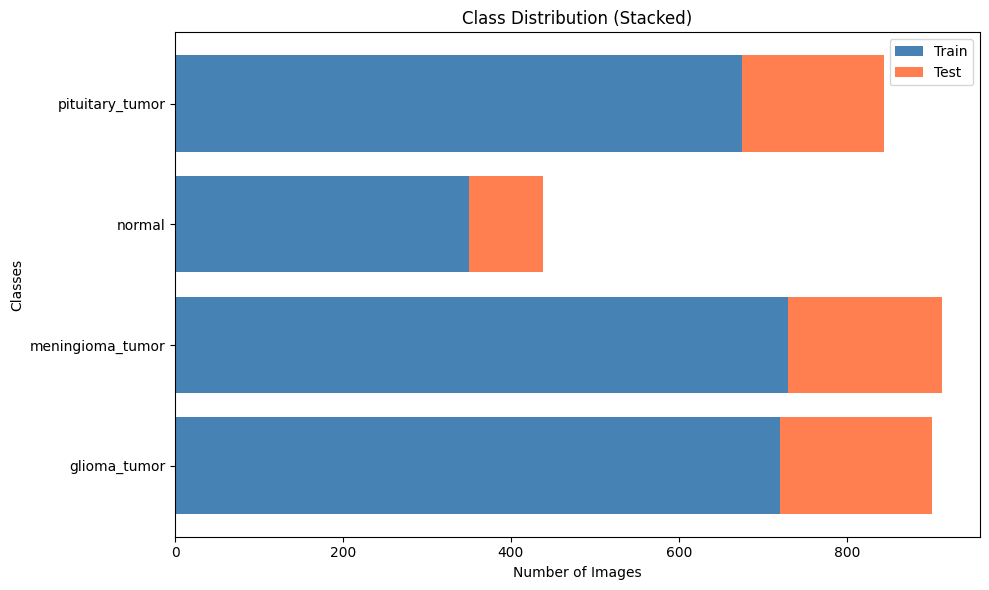

In [38]:
# Plot class distribution using horizontal stacked bar chart
plt.figure(figsize=(10, 6))

y = np.arange(len(classes))

plt.barh(y, eda_df["Train Images"], label="Train", color="steelblue")
plt.barh(y, eda_df["Test Images"], left=eda_df["Train Images"], label="Test", color="coral")

plt.yticks(y, classes)
plt.xlabel("Number of Images")
plt.ylabel("Classes")
plt.title("Class Distribution (Stacked)")

plt.legend()
plt.tight_layout()
plt.show()

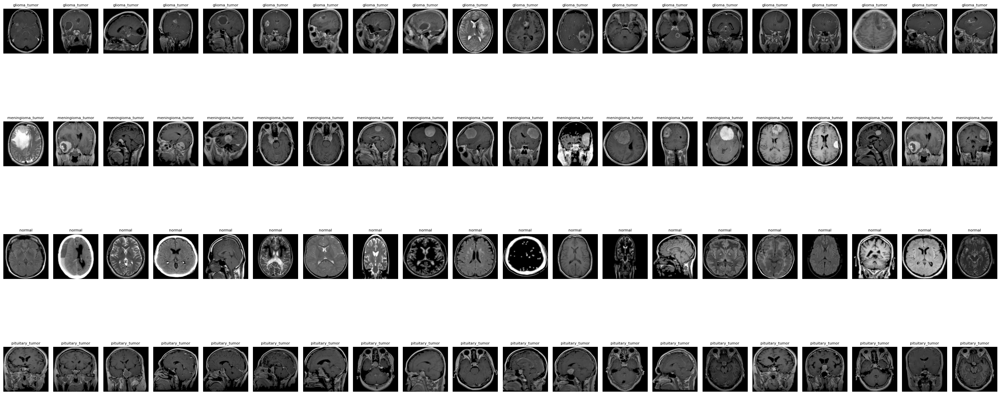

In [39]:
def show_sample_images(folder_path, class_names, samples_per_class=20):

    plt.figure(figsize=(30, 15))

    plot_index = 1

    for class_name in class_names:

        class_path = os.path.join(folder_path, class_name)

        image_files = [
            file for file in os.listdir(class_path)
            if file.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        # Select 20 random images (or fewer if not enough images)
        selected_files = random.sample(
            image_files,
            min(samples_per_class, len(image_files))
        )

        for image_file in selected_files:

            image_path = os.path.join(class_path, image_file)

            try:
                image = Image.open(image_path).convert("RGB")
            except Image.UnidentifiedImageError:
                # Skip corrupted images
                print(f"Skipping unidentified image: {image_path}")
                continue

            plt.subplot(
                len(class_names),      # rows
                samples_per_class,     # columns
                plot_index
            )

            plt.imshow(image)
            plt.title(class_name, fontsize=8)
            plt.axis("off")

            plot_index += 1

    plt.tight_layout()
    plt.show()


# Display 20 sample images from each category
show_sample_images(train_path, classes, samples_per_class=20)

In [40]:
# Analyze image dimensions and color channels
# Display information for one category only

image_info = []

# Choose first category for analysis
selected_class = classes[0]   # Example: first class

class_path = os.path.join(train_path, selected_class)

# Process first 50 images from selected category
image_files = os.listdir(class_path)[:50]

for image_file in image_files:

    image_path = os.path.join(class_path, image_file)

    try:
        image = Image.open(image_path)

        width, height = image.size

        image_info.append([
            selected_class,
            width,
            height,
            image.mode
        ])

    except:
        pass

# Create DataFrame
size_df = pd.DataFrame(
    image_info,
    columns=["Class", "Width", "Height", "Mode"]
)

# Display results
print(size_df.head())

print("\nImage Size Distribution:")
print(
    size_df.groupby(["Width", "Height"])
    .size()
    .sort_values(ascending=False)
)

print("\nImage Color Modes:")
print(size_df["Mode"].value_counts())

          Class  Width  Height Mode
0  glioma_tumor    256     256  RGB
1  glioma_tumor    256     256  RGB
2  glioma_tumor    256     256  RGB
3  glioma_tumor    256     256  RGB
4  glioma_tumor    256     256  RGB

Image Size Distribution:
Width  Height
256    256       49
dtype: int64

Image Color Modes:
Mode
RGB    49
Name: count, dtype: int64


In [41]:
# Identify duplicate images by computing file hashes
duplicate_hashes = {}
duplicate_images = []

for folder in [train_path, test_path]:

    for class_name in classes:

        class_path = os.path.join(folder, class_name)

        image_files = os.listdir(class_path)

        for image_file in image_files:

            image_path = os.path.join(class_path, image_file)

            try:
                with open(image_path, "rb") as file:
                    file_hash = hashlib.md5(file.read()).hexdigest()

                if file_hash in duplicate_hashes:
                    duplicate_images.append(image_path)

                else:
                    duplicate_hashes[file_hash] = image_path

            except:
                pass


print("Total Duplicate Images:", len(duplicate_images))

Total Duplicate Images: 244


In [42]:
# Find corrupted or unreadable images
corrupted_images = []

for folder in [train_path, test_path]:

    for class_name in classes:

        class_path = os.path.join(folder, class_name)

        image_files = os.listdir(class_path)

        for image_file in image_files:

            image_path = os.path.join(class_path, image_file)

            try:
                image = Image.open(image_path)
                image.verify()

            except:
                corrupted_images.append(image_path)


print("Total Corrupted Images:", len(corrupted_images))

Total Corrupted Images: 28


In [43]:
# Delete corrupted and duplicate image files
removed_files = []

for image_path in corrupted_images:

    if os.path.exists(image_path):

        os.remove(image_path)

        removed_files.append(image_path)


for image_path in duplicate_images:

    if os.path.exists(image_path):

        os.remove(image_path)

        removed_files.append(image_path)


print("Total Removed Files:", len(removed_files))

Total Removed Files: 272


In [44]:
# Count images again after data cleaning
train_counts_after = count_images_by_class(train_path, classes)
test_counts_after = count_images_by_class(test_path, classes)

cleaned_df = pd.DataFrame({
    "Class": classes,
    "Train Images": [train_counts_after[class_name] for class_name in classes],
    "Test Images": [test_counts_after[class_name] for class_name in classes]
})

cleaned_df["Total Images"] = cleaned_df["Train Images"] + cleaned_df["Test Images"]

print(cleaned_df)

print("\nFinal Training Images:", cleaned_df["Train Images"].sum())
print("Final Testing Images:", cleaned_df["Test Images"].sum())
print("Final Total Images:", cleaned_df["Total Images"].sum())

              Class  Train Images  Test Images  Total Images
0      glioma_tumor           701          177           878
1  meningioma_tumor           668          144           812
2            normal           259           48           307
3   pituitary_tumor           663          164           827

Final Training Images: 2291
Final Testing Images: 533
Final Total Images: 2824


## BASELINE MODEL

The baseline CNN model serves as a foundational architecture for brain tumor classification. It consists of three convolutional blocks with increasing filter sizes (32, 64, 128), each followed by max pooling for spatial dimension reduction. The model uses ReLU activation functions for non-linearity and includes dropout layers (0.3 and 0.5) to prevent overfitting. The architecture concludes with fully connected dense layers (256 and 128 neurons) before the final softmax output layer for 4-class classification. This simple yet effective design establishes a performance benchmark against which more complex models and transfer learning approaches can be compared. The model is trained using the Adam optimizer with a learning rate of 0.001 and categorical cross-entropy loss.


In [45]:
# Set up image preprocessing and data augmentation parameters
#Add text cell calling BaseLine Model
#rotation range=15,
image_size = 256
batch_size = 32

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=15,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.10,
    horizontal_flip=True,
    validation_split=0.20
)

validation_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    validation_split=0.20
)

test_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0
)

In [46]:
# Initialize training, validation, and testing data generators
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

validation_generator = validation_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False
)

print("Training Samples:", train_generator.samples)
print("Validation Samples:", validation_generator.samples)
print("Testing Samples:", test_generator.samples)

Found 1835 images belonging to 4 classes.
Found 456 images belonging to 4 classes.
Found 533 images belonging to 4 classes.
Training Samples: 1835
Validation Samples: 456
Testing Samples: 533


In [47]:
# Compute class weights to handle imbalanced dataset
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)

class_weight_dict = dict(enumerate(class_weights))

print("Class Weights:")
print(class_weight_dict)

Class Weights:
{0: np.float64(0.8177361853832442), 1: np.float64(0.8574766355140186), 2: np.float64(2.2055288461538463), 3: np.float64(0.8639359698681732)}


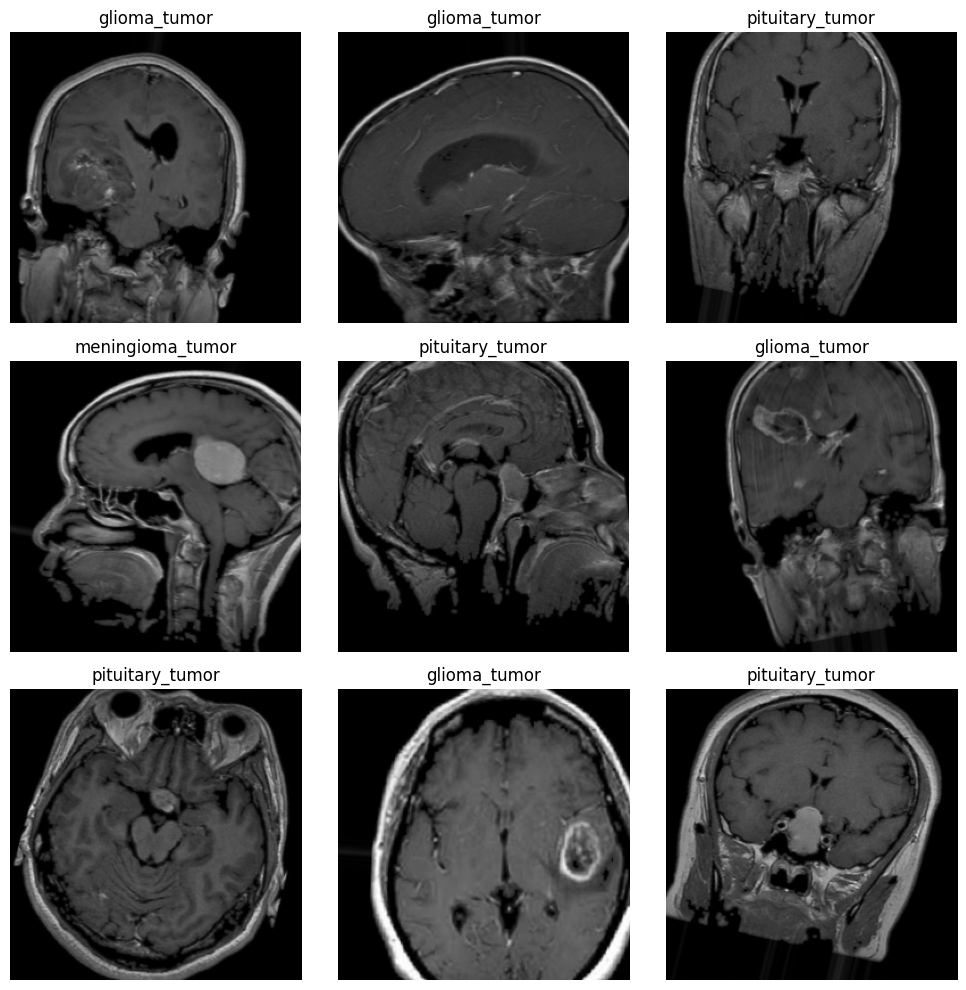

In [48]:
# Display sample augmented training images
images, labels = next(train_generator)

class_names = list(train_generator.class_indices.keys())

plt.figure(figsize=(10, 10))

for i in range(9):

    plt.subplot(3, 3, i + 1)

    plt.imshow(images[i])

    label_index = np.argmax(labels[i])

    plt.title(class_names[label_index])

    plt.axis("off")

plt.tight_layout()
plt.show()

In [49]:
# Specify input dimensions and output classes
input_shape = (image_size, image_size, 3)

num_classes = train_generator.num_classes

print("Input Shape:", input_shape)
print("Number of Classes:", num_classes)

Input Shape: (256, 256, 3)
Number of Classes: 4


In [50]:
# Load necessary modules for constructing CNN architecture
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    Flatten,
    Dense
)

from tensorflow.keras.optimizers import Adam

In [ ]:
# Build baseline CNN model
#Convd 16,32,64 Dense 64,32,16
baseline_model = Sequential([

    Conv2D(16, (3, 3), activation="relu", input_shape=input_shape),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(32, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    Dense(64, activation="relu"),
    Dense(32, activation="relu"),
    Dense(16, activation="relu"),

    Dense(num_classes, activation="softmax")
])

# Display model architecture
baseline_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_94 (Conv2D)              │ (None, 254, 254, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 127, 127, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_95 (Conv2D)              │ (None, 125, 125, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_96 (Conv2D)              │ (None, 60, 60, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 57600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │     3,686,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │            68 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,712,724 (14.16 MB)

 Trainable params: 3,712,724 (14.16 MB)

 Non-trainable params: 0 (0.00 B)

In [52]:
# Compile baseline CNN model
#learning=0.002
baseline_model.compile(
    optimizer=Adam(learning_rate=0.002),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Baseline CNN model compiled successfully.")

Baseline CNN model compiled successfully.


In [53]:
# Import callbacks for better training control
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)
from tensorflow.keras.callbacks import ModelCheckpoint

In [54]:
# Define training callbacks
#patience=6,patience=4,
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=6,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=4,
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    "baseline_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

callbacks = [
    early_stopping,
    reduce_lr,
    model_checkpoint
]

In [55]:
# Train baseline CNN model
# epochs = 40
epochs = 40

baseline_history = baseline_model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

Epoch 1/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.2029 - loss: 1.5470
Epoch 1: val_accuracy improved from None to 0.32675, saving model to baseline_best_model.keras

Epoch 1: finished saving model to baseline_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 45s 592ms/step - accuracy: 0.2616 - loss: 1.4212 - val_accuracy: 0.3268 - val_loss: 1.3302 - learning_rate: 0.0020
Epoch 2/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step - accuracy: 0.3477 - loss: 1.3075
Epoch 2: val_accuracy improved from 0.32675 to 0.52632, saving model to baseline_best_model.keras

Epoch 2: finished saving model to baseline_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 30s 506ms/step - accuracy: 0.3575 - loss: 1.3068 - val_accuracy: 0.5263 - val_loss: 1.2506 - learning_rate: 0.0020
Epoch 3/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step - accuracy: 0.4745 - loss: 1.1923
Epoch 3: val_accuracy did not improve from 0.52632
58/58 ━━━━━━━━━━━━━━━━━━━━ 30s 508ms/step - accuracy: 0.4965 - loss: 1.1656 - val_accuracy: 

In [56]:
# Display best training results
best_epoch = np.argmax(
    baseline_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    baseline_history.history["val_accuracy"]
)

best_val_loss = min(
    baseline_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 20
Best Validation Accuracy: 0.739
Best Validation Loss: 0.7011


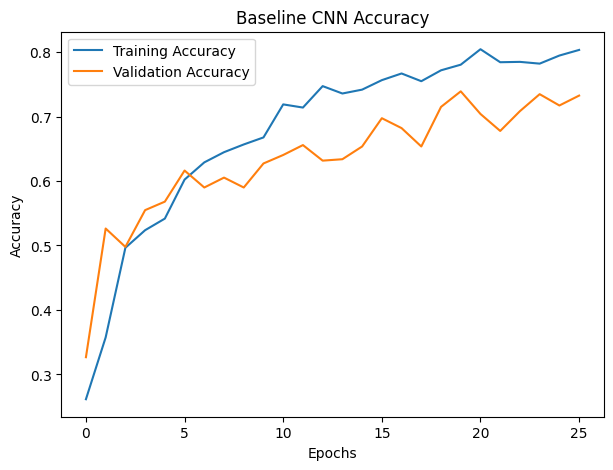

In [57]:
# Plot training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    baseline_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    baseline_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Baseline CNN Accuracy")

plt.legend()
plt.show()

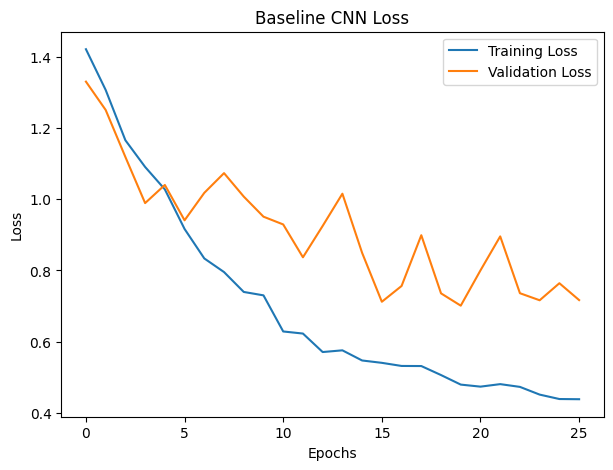

In [58]:
# Plot training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    baseline_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    baseline_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Baseline CNN Loss")

plt.legend()
plt.show()

In [59]:
# Import evaluation metrics
from sklearn.metrics import (
    classification_report,
    confusion_matrix
)

In [60]:
# Generate predictions on test dataset
y_pred_probabilities = baseline_model.predict(
    test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = test_generator.classes

class_names = list(
    test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step


In [61]:
# Display classification metrics
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.88      0.69      0.78       177
meningioma_tumor       0.71      0.62      0.67       144
          normal       0.74      0.77      0.76        48
 pituitary_tumor       0.73      0.97      0.83       164

        accuracy                           0.77       533
       macro avg       0.77      0.77      0.76       533
    weighted avg       0.78      0.77      0.76       533



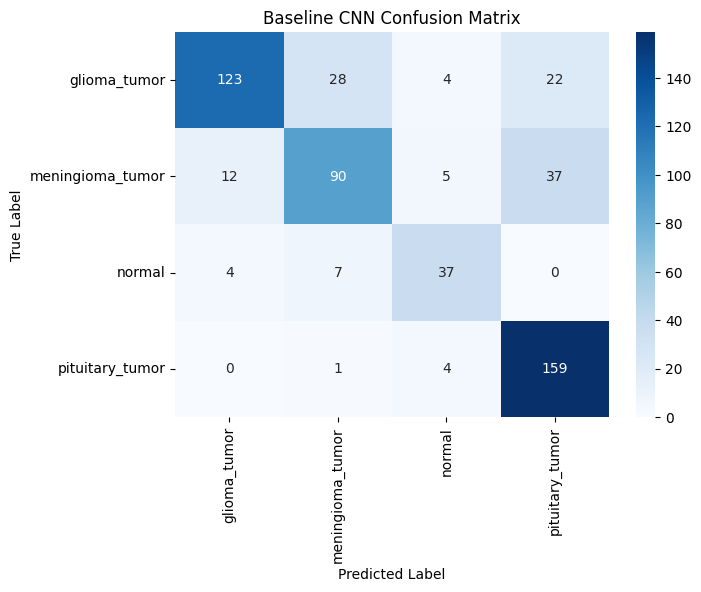

In [62]:
# Plot confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Baseline CNN Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


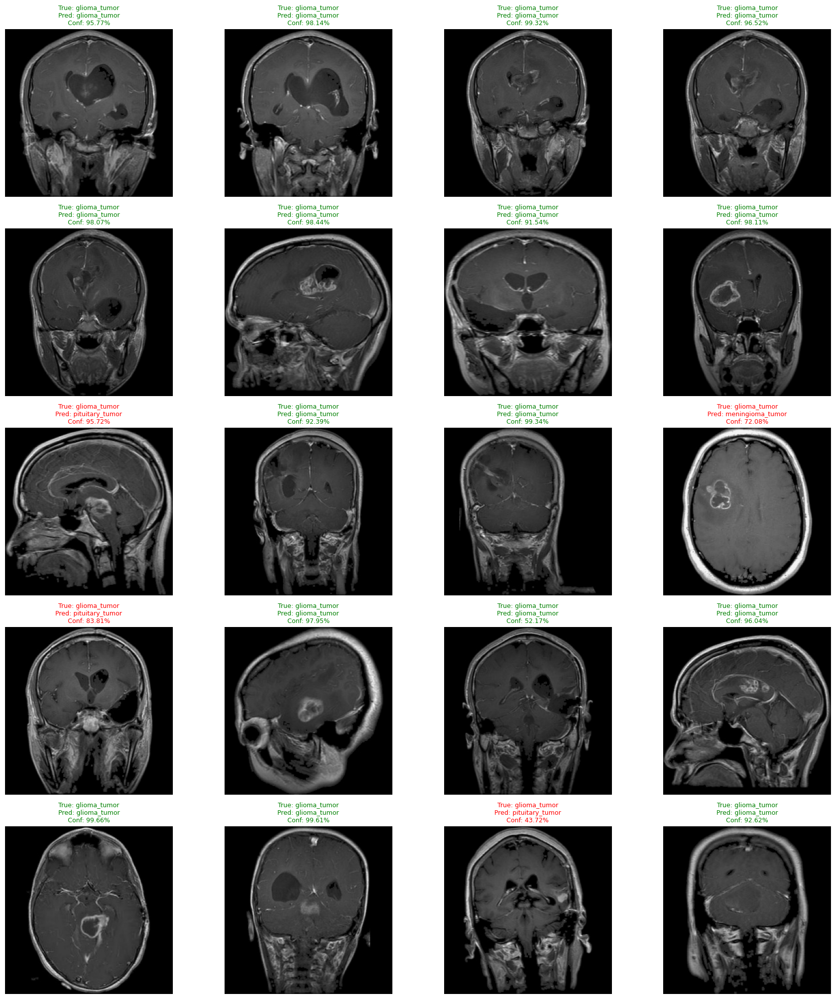

In [63]:
# Display sample predictions from test dataset
#Range= 20
test_images, test_labels = next(test_generator)

predictions = baseline_model.predict(test_images)

plt.figure(figsize=(18, 20))

for i in range(20):

    plt.subplot(5, 4, i + 1)

    plt.imshow(test_images[i])

    true_index = np.argmax(test_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]

    confidence = predictions[i][pred_index] * 100

    title_color = (
        "green"
        if true_index == pred_index
        else "red"
    )

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [64]:
# Save final baseline CNN model
baseline_model.save("baseline_cnn_final_model.keras")

print("Baseline CNN model saved successfully.")

Baseline CNN model saved successfully.


In [65]:
# Save training history for later comparison
baseline_history_df = pd.DataFrame(baseline_history.history)

baseline_history_df.to_csv(
    "baseline_cnn_training_history.csv",
    index=False
)

print("Baseline training history saved successfully.")

Baseline training history saved successfully.


**DEEPER CNN MODEL**

The Deeper CNN model extends the baseline architecture by adding more convolutional layers and increasing model capacity. It features four convolutional blocks with progressively increasing filters (32, 64, 128, 256), allowing the network to learn more complex hierarchical features from the brain tumor images. Each block contains multiple convolutional layers followed by batch normalization for training stability and max pooling for spatial reduction. Dropout regularization (0.3, 0.4, 0.5) is applied at different stages to combat overfitting. The architecture includes deeper fully connected layers (512, 256 neurons) before the final classification layer. This model is trained with the Adam optimizer (learning rate 0.001) to evaluate whether increased depth and capacity improve classification performance compared to the baseline model.


In [ ]:

# Import layers for deeper CNN architecture
from tensorflow.keras.layers import (
    BatchNormalization,
    Dropout
)

In [ ]:
# Conv2D 16,32,64,128,256,256 And Dense 32,64,128
# Better deeper architecture for your dataset
deeper_model = Sequential([

    Conv2D(16, (3, 3), activation="relu", padding="same", input_shape=input_shape),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(32, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    Dense(32, activation="relu"),
    Dropout(0.5),

    Dense(64, activation="relu"),
    Dropout(0.3),

    Dense(128, activation="relu"),

    Dense(num_classes, activation="softmax")
])

deeper_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_97 (Conv2D)              │ (None, 256, 256, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_94          │ (None, 256, 256, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_98 (Conv2D)              │ (None, 128, 128, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_95          │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_99 (Conv2D)              │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_96          │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_100 (Conv2D)             │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_97          │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_101 (Conv2D)             │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_98          │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_102 (Conv2D)             │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_99          │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 32)             │       131,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │         2,11

 Total params: 1,127,748 (4.30 MB)

 Trainable params: 1,126,244 (4.30 MB)

 Non-trainable params: 1,504 (5.88 KB)

In [ ]:
# Compile deeper CNN model
#Learning Rate = 0.02
deeper_model.compile(
    optimizer=Adam(learning_rate=0.002),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Deeper CNN model compiled successfully.")

Deeper CNN model compiled successfully.


In [69]:
# Define callbacks for deeper CNN model
deeper_checkpoint = ModelCheckpoint(
    "deeper_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

deeper_callbacks = [
    early_stopping,
    reduce_lr,
    deeper_checkpoint
]

In [ ]:
# Train deeper CNN model and record training time
#Epochs=40
import time

start_time = time.time()

deeper_history = deeper_model.fit(
    train_generator,
    epochs=40,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=deeper_callbacks
)

end_time = time.time()

deeper_training_time = end_time - start_time

print("Deeper CNN Training Time:", round(deeper_training_time, 2), "seconds")

Epoch 1/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 598ms/step - accuracy: 0.2040 - loss: 1.5895
Epoch 1: val_accuracy improved from None to 0.29167, saving model to deeper_best_model.keras

Epoch 1: finished saving model to deeper_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 55s 680ms/step - accuracy: 0.2523 - loss: 1.4323 - val_accuracy: 0.2917 - val_loss: 1.4053 - learning_rate: 0.0020
Epoch 2/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 506ms/step - accuracy: 0.3152 - loss: 1.3760
Epoch 2: val_accuracy did not improve from 0.29167
58/58 ━━━━━━━━━━━━━━━━━━━━ 30s 519ms/step - accuracy: 0.2948 - loss: 1.3888 - val_accuracy: 0.1118 - val_loss: 3.3145 - learning_rate: 0.0020
Epoch 3/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step - accuracy: 0.3139 - loss: 1.3804
Epoch 3: val_accuracy improved from 0.29167 to 0.30702, saving model to deeper_best_model.keras

Epoch 3: finished saving model to deeper_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 30s 516ms/step - accuracy: 0.3166 - loss: 1.3831 - val_accuracy: 0.3070 -

In [71]:
# Load the best saved deeper CNN model
deeper_model = tf.keras.models.load_model(
    "deeper_best_model.keras"
)

print("Best deeper CNN model loaded successfully.")

Best deeper CNN model loaded successfully.


In [72]:
# Display best validation results
best_epoch = np.argmax(
    deeper_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    deeper_history.history["val_accuracy"]
)

best_val_loss = min(
    deeper_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 6
Best Validation Accuracy: 0.3246
Best Validation Loss: 1.4053


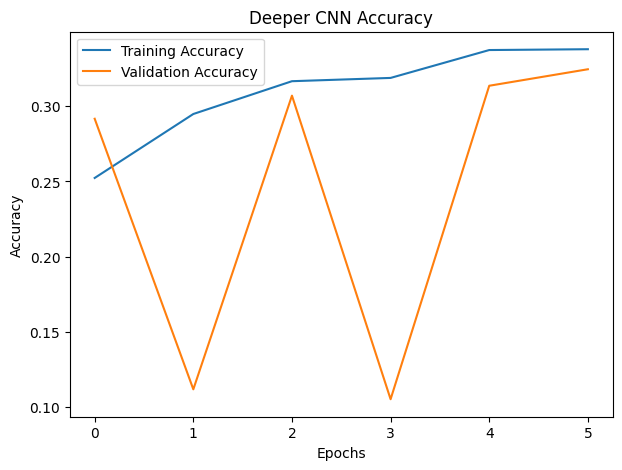

In [73]:
# Plot training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    deeper_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    deeper_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Deeper CNN Accuracy")

plt.legend()
plt.show()

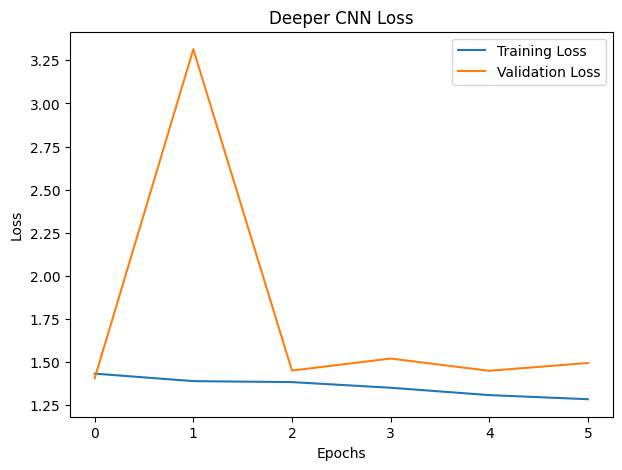

In [74]:
# Plot training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    deeper_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    deeper_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Deeper CNN Loss")

plt.legend()
plt.show()

In [75]:
# Generate predictions on test dataset
y_pred_probabilities = deeper_model.predict(
    test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = test_generator.classes

class_names = list(
    test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step


In [76]:
# Display classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.33      0.01      0.02       177
meningioma_tumor       0.00      0.00      0.00       144
          normal       0.52      0.52      0.52        48
 pituitary_tumor       0.32      0.94      0.48       164

        accuracy                           0.34       533
       macro avg       0.29      0.37      0.26       533
    weighted avg       0.26      0.34      0.20       533



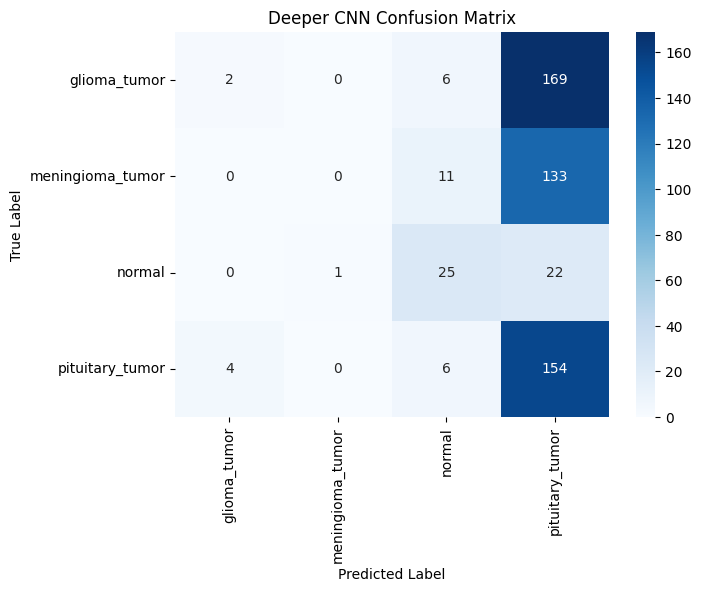

In [77]:
# Plot confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Deeper CNN Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


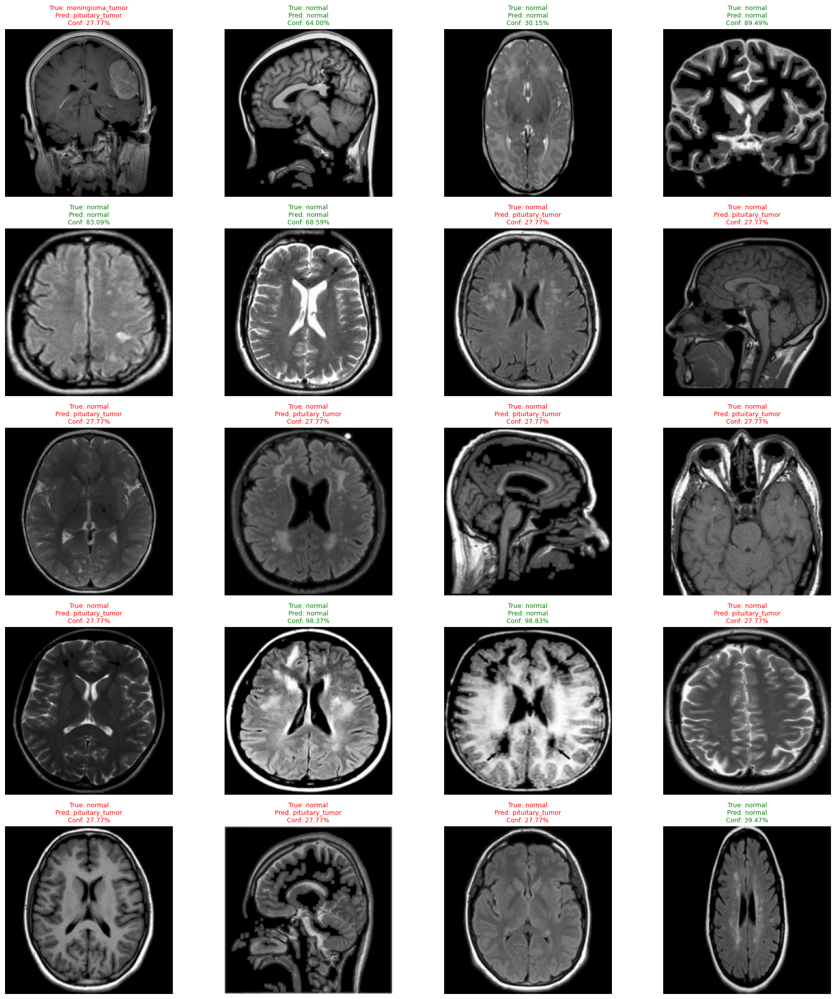

In [87]:
# Display sample predictions from deeper CNN model
test_images, test_labels = next(test_generator)

predictions = deeper_model.predict(test_images)

plt.figure(figsize=(18, 20))

for i in range(20):

    plt.subplot(5, 4, i + 1)

    plt.imshow(test_images[i])

    true_index = np.argmax(test_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]

    confidence = predictions[i][pred_index] * 100

    title_color = (
        "green"
        if true_index == pred_index
        else "red"
    )

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [88]:
# Compare baseline and deeper CNN performance
baseline_best_accuracy = max(
    baseline_history.history["val_accuracy"]
)

baseline_best_loss = min(
    baseline_history.history["val_loss"]
)

deeper_best_accuracy = max(
    deeper_history.history["val_accuracy"]
)

deeper_best_loss = min(
    deeper_history.history["val_loss"]
)

comparison_df = pd.DataFrame({
    "Model": ["Baseline CNN", "Deeper CNN"],
    "Best Validation Accuracy": [
        baseline_best_accuracy,
        deeper_best_accuracy
    ],
    "Best Validation Loss": [
        baseline_best_loss,
        deeper_best_loss
    ]
})

comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,Baseline CNN,0.739035,0.701126
1,Deeper CNN,0.324561,1.405334


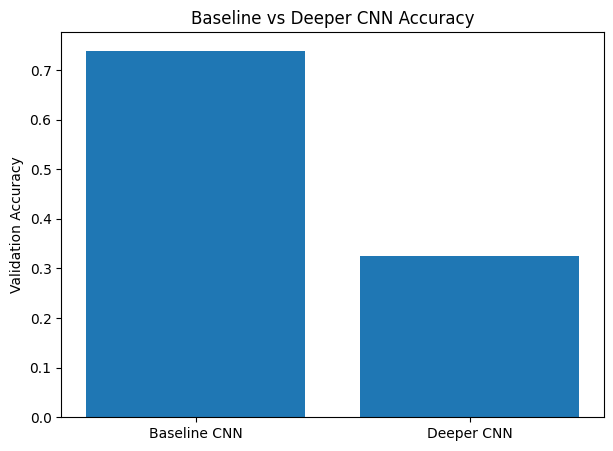

In [89]:
# Visualize model comparison
plt.figure(figsize=(7, 5))

plt.bar(
    comparison_df["Model"],
    comparison_df["Best Validation Accuracy"]
)

plt.ylabel("Validation Accuracy")
plt.title("Baseline vs Deeper CNN Accuracy")

plt.show()

In [90]:
# Import SGD optimizer
from tensorflow.keras.optimizers import SGD

In [91]:
# Build deeper CNN model with SGD optimizer
#change learning rate to 0.002
#change momemntum to 0.8
sgd_model = tf.keras.models.clone_model(deeper_model)

sgd_model.compile(
    optimizer=SGD(
        learning_rate=0.002,
        momentum=0.8
    ),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("SGD model compiled successfully.")

SGD model compiled successfully.


In [ ]:
# Train deeper CNN model using SGD optimizer
#Epochs=40
sgd_history = sgd_model.fit(
    train_generator,
    epochs=40,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

Epoch 1/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 547ms/step - accuracy: 0.2454 - loss: 1.4681
Epoch 1: val_accuracy did not improve from 0.73904
58/58 ━━━━━━━━━━━━━━━━━━━━ 43s 586ms/step - accuracy: 0.2812 - loss: 1.3723 - val_accuracy: 0.1294 - val_loss: 1.4419 - learning_rate: 0.0020
Epoch 2/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step - accuracy: 0.3389 - loss: 1.3048
Epoch 2: val_accuracy did not improve from 0.73904
58/58 ━━━━━━━━━━━━━━━━━━━━ 29s 502ms/step - accuracy: 0.3477 - loss: 1.2998 - val_accuracy: 0.2895 - val_loss: 1.4655 - learning_rate: 0.0020
Epoch 3/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step - accuracy: 0.3800 - loss: 1.2449
Epoch 3: val_accuracy did not improve from 0.73904
58/58 ━━━━━━━━━━━━━━━━━━━━ 30s 510ms/step - accuracy: 0.3569 - loss: 1.2654 - val_accuracy: 0.1645 - val_loss: 1.4571 - learning_rate: 0.0020
Epoch 4/40
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step - accuracy: 0.3890 - loss: 1.2407
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0010000000474974513.



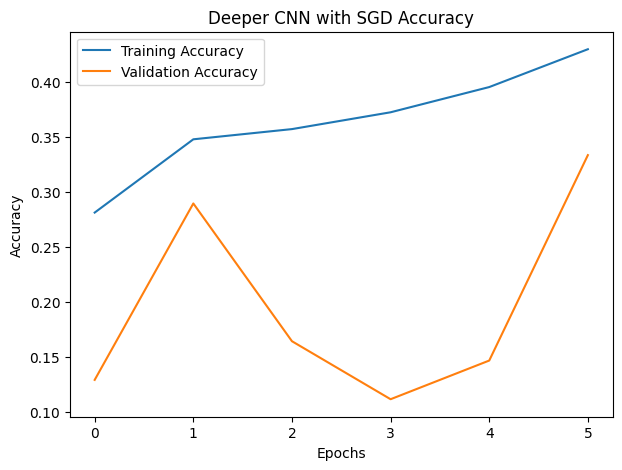

In [93]:
# Plot SGD training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    sgd_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    sgd_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Deeper CNN with SGD Accuracy")

plt.legend()
plt.show()

In [94]:
# Display best SGD validation results
best_sgd_epoch = np.argmax(
    sgd_history.history["val_accuracy"]
) + 1

best_sgd_accuracy = max(
    sgd_history.history["val_accuracy"]
)

best_sgd_loss = min(
    sgd_history.history["val_loss"]
)

print("Best SGD Epoch:", best_sgd_epoch)

print(
    "Best SGD Validation Accuracy:",
    round(best_sgd_accuracy, 4)
)

print(
    "Best SGD Validation Loss:",
    round(best_sgd_loss, 4)
)

Best SGD Epoch: 6
Best SGD Validation Accuracy: 0.3333
Best SGD Validation Loss: 1.3458


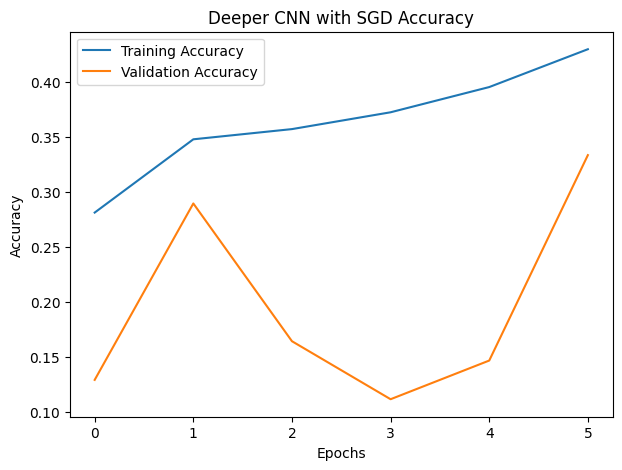

In [95]:
# Plot SGD training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    sgd_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    sgd_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Deeper CNN with SGD Accuracy")

plt.legend()
plt.show()

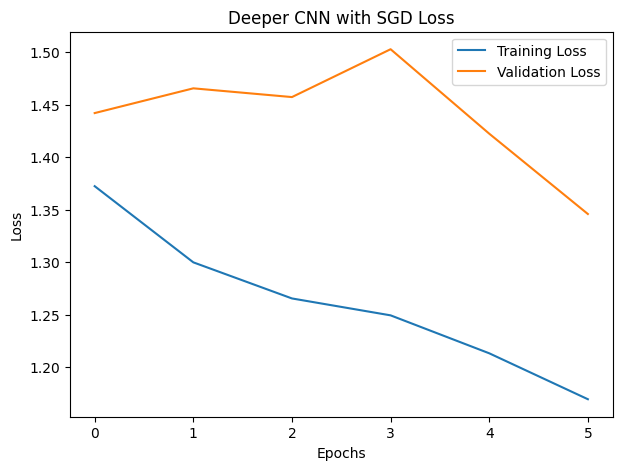

In [96]:
# Plot SGD training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    sgd_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    sgd_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Deeper CNN with SGD Loss")

plt.legend()
plt.show()

In [97]:
# Generate predictions using SGD model
y_pred_probabilities = sgd_model.predict(
    test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = test_generator.classes

class_names = list(
    test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step


In [98]:
# Display SGD classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.00      0.00      0.00       177
meningioma_tumor       0.15      0.01      0.03       144
          normal       0.09      0.94      0.16        48
 pituitary_tumor       0.00      0.00      0.00       164

        accuracy                           0.09       533
       macro avg       0.06      0.24      0.05       533
    weighted avg       0.05      0.09      0.02       533



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


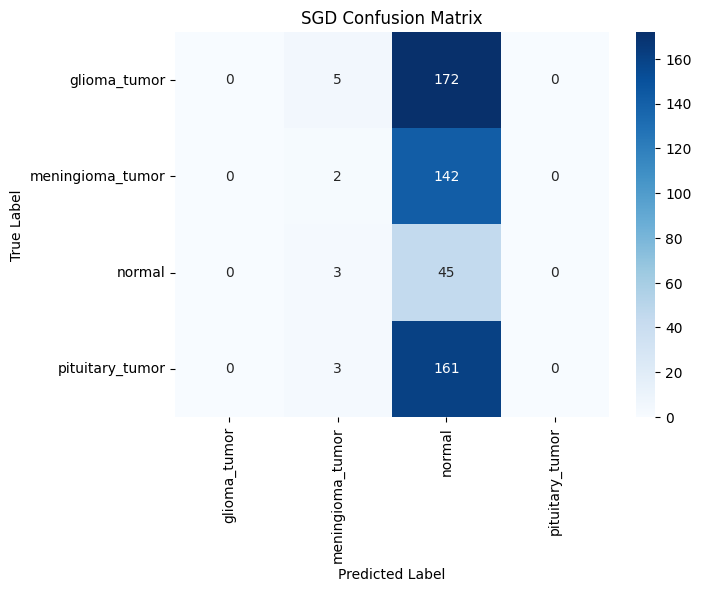

In [99]:
# Plot SGD confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("SGD Confusion Matrix")

plt.show()

**Optimizer Comparison: Evaluating Adam vs SGD optimizers**

In [100]:
# Compare Adam and SGD optimizer performance
optimizer_comparison_df = pd.DataFrame({
    "Optimizer": ["Adam", "SGD"],

    "Best Validation Accuracy": [
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(deeper_history.history["val_loss"]),
        min(sgd_history.history["val_loss"])
    ]
})

optimizer_comparison_df

,Optimizer,Best Validation Accuracy,Best Validation Loss
0,Adam,0.324561,1.405334
1,SGD,0.333333,1.345787


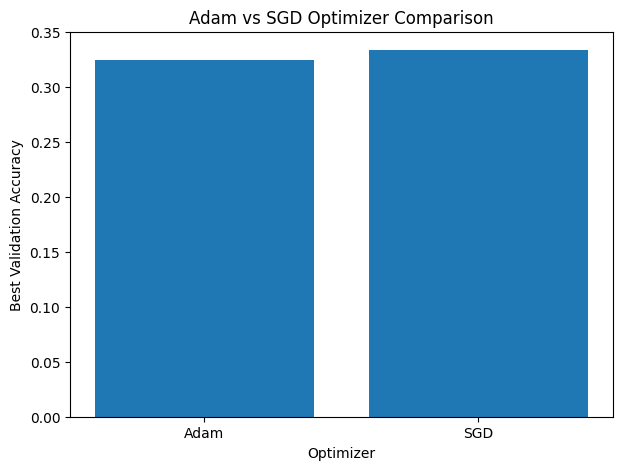

In [101]:
# Visualize Adam vs SGD comparison
plt.figure(figsize=(7, 5))

plt.bar(
    optimizer_comparison_df["Optimizer"],
    optimizer_comparison_df["Best Validation Accuracy"]
)

plt.xlabel("Optimizer")
plt.ylabel("Best Validation Accuracy")
plt.title("Adam vs SGD Optimizer Comparison")

plt.show()

In [102]:
# Import Input layer
from tensorflow.keras import Input

In [ ]:
#Conv2D=16,32,64,128,256,256
# Build deeper CNN model without dropout
ablation_model = Sequential([

    Input(shape=input_shape),

    Conv2D(16, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(32, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    Dense(256, activation="relu"),

    Dense(128, activation="relu"),

    Dense(64, activation="relu"),

    Dense(num_classes, activation="softmax")
])

ablation_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_103 (Conv2D)             │ (None, 256, 256, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_100         │ (None, 256, 256, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_104 (Conv2D)             │ (None, 128, 128, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_101         │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_105 (Conv2D)             │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_102         │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_106 (Conv2D)             │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_103         │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_107 (Conv2D)             │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_104         │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_108 (Conv2D)             │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_105         │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 256)            │     1,048,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │         8,25

 Total params: 2,075,940 (7.92 MB)

 Trainable params: 2,074,436 (7.91 MB)

 Non-trainable params: 1,504 (5.88 KB)

**Ablation Study: Analyzing the impact of dropout regularization on model performance**

In [104]:
# Compile ablation model
ablation_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Ablation model compiled successfully.")

Ablation model compiled successfully.


In [105]:
# Train ablation model without dropout
ablation_history = ablation_model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

Epoch 1/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - accuracy: 0.4127 - loss: 1.5360
Epoch 1: val_accuracy did not improve from 0.73904
58/58 ━━━━━━━━━━━━━━━━━━━━ 45s 604ms/step - accuracy: 0.4943 - loss: 1.1866 - val_accuracy: 0.1645 - val_loss: 1.8325 - learning_rate: 0.0010
Epoch 2/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 507ms/step - accuracy: 0.6133 - loss: 0.8749
Epoch 2: val_accuracy did not improve from 0.73904
58/58 ━━━━━━━━━━━━━━━━━━━━ 30s 520ms/step - accuracy: 0.6523 - loss: 0.8040 - val_accuracy: 0.1118 - val_loss: 4.7380 - learning_rate: 0.0010
Epoch 3/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step - accuracy: 0.7323 - loss: 0.6432
Epoch 3: val_accuracy did not improve from 0.73904
58/58 ━━━━━━━━━━━━━━━━━━━━ 30s 510ms/step - accuracy: 0.7264 - loss: 0.6381 - val_accuracy: 0.3421 - val_loss: 1.6157 - learning_rate: 0.0010
Epoch 4/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step - accuracy: 0.7369 - loss: 0.5885
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.



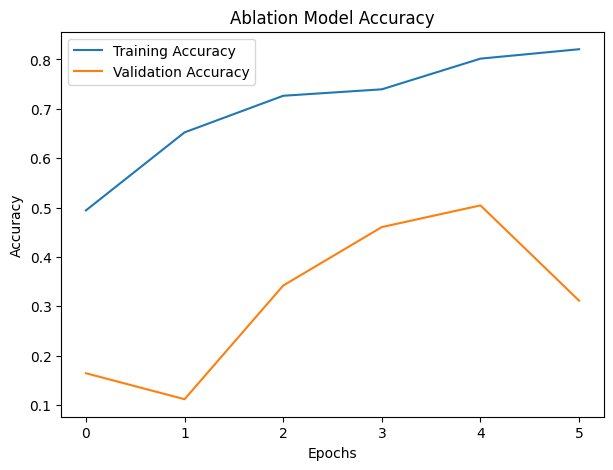

In [106]:
# Plot ablation model accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    ablation_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    ablation_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Ablation Model Accuracy")

plt.legend()
plt.show()

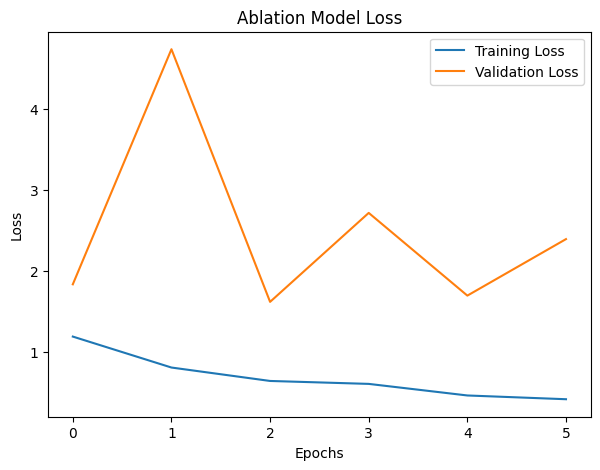

In [107]:
# Plot ablation model loss
plt.figure(figsize=(7, 5))

plt.plot(
    ablation_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    ablation_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Ablation Model Loss")

plt.legend()
plt.show()

In [108]:
# Compare deeper CNN and ablation model
ablation_comparison_df = pd.DataFrame({
    "Model": [
        "With Dropout",
        "Without Dropout"
    ],

    "Best Validation Accuracy": [
        max(deeper_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(deeper_history.history["val_loss"]),
        min(ablation_history.history["val_loss"])
    ]
})

ablation_comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,With Dropout,0.324561,1.405334
1,Without Dropout,0.504386,1.615679


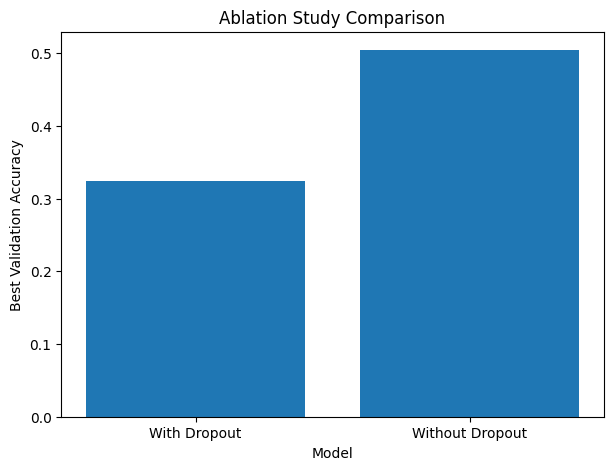

In [109]:
# Visualize ablation study comparison
plt.figure(figsize=(7, 5))

plt.bar(
    ablation_comparison_df["Model"],
    ablation_comparison_df["Best Validation Accuracy"]
)

plt.xlabel("Model")
plt.ylabel("Best Validation Accuracy")
plt.title("Ablation Study Comparison")

plt.show()

In [110]:
# Create final model comparison table
final_comparison_df = pd.DataFrame({

    "Model": [
        "Baseline CNN",
        "Deeper CNN (Adam)",
        "Deeper CNN (SGD)",
        "Deeper CNN Without Dropout"
    ],

    "Best Validation Accuracy": [
        max(baseline_history.history["val_accuracy"]),
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(baseline_history.history["val_loss"]),
        min(deeper_history.history["val_loss"]),
        min(sgd_history.history["val_loss"]),
        min(ablation_history.history["val_loss"])
    ]
})

final_comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,Baseline CNN,0.739035,0.701126
1,Deeper CNN (Adam),0.324561,1.405334
2,Deeper CNN (SGD),0.333333,1.345787
3,Deeper CNN Without Dropout,0.504386,1.615679


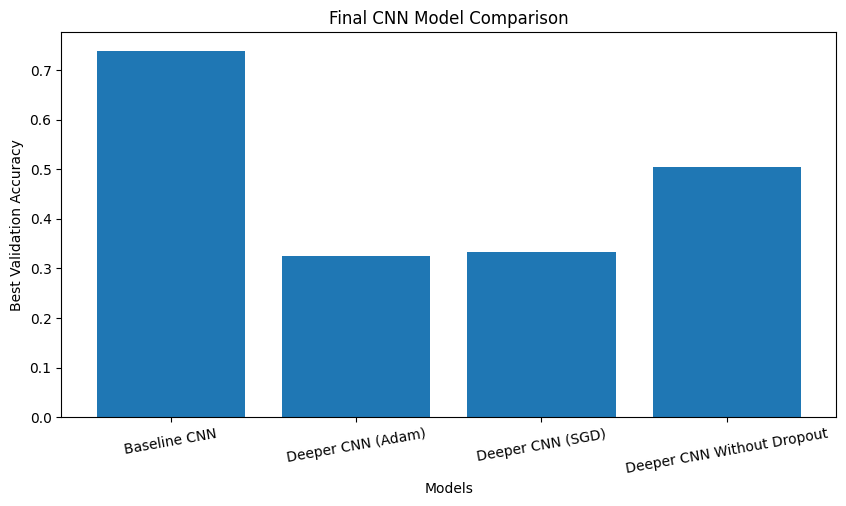

In [111]:
# Visualize final model comparison
plt.figure(figsize=(10, 5))

plt.bar(
    final_comparison_df["Model"],
    final_comparison_df["Best Validation Accuracy"]
)

plt.xticks(rotation=10)

plt.xlabel("Models")
plt.ylabel("Best Validation Accuracy")
plt.title("Final CNN Model Comparison")

plt.show()

In [112]:
final_comparison_df.to_csv(
    "/content/drive/MyDrive/final_model_comparison.csv",
    index=False
)

** Transfer Learning with InceptionV3 for Brain Tumor Classification**
This section explores transfer learning using InceptionV3, a powerful pre-trained convolutional neural network developed by Google. InceptionV3 is trained on ImageNet with millions of images and employs inception modules that capture features at multiple scales simultaneously through parallel convolutional operations.

Two approaches are implemented:

1. **Feature Extraction**: The pre-trained InceptionV3 base (frozen weights) is used as a fixed feature extractor, with only custom classification layers trained on brain tumor data. Input images are resized to 299×299 pixels as required by InceptionV3 architecture.

2. **Fine-Tuning**: After initial training, the last 30 layers of InceptionV3 are unfrozen and fine-tuned with a lower learning rate (0.00001) to adapt the pre-trained features specifically for brain tumor classification.

Transfer learning leverages knowledge from large-scale datasets to improve performance on medical imaging tasks with limited data. The InceptionV3 models are compared against custom CNN architectures to evaluate the effectiveness of transfer learning for brain tumor classification.



In [5]:
# Import libraries for transfer learning using InceptionV3
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input,
    Dense,
    Dropout,
    GlobalAveragePooling2D
)

In [ ]:
# Configure image preprocessing for InceptionV3
image_size = 299  # Changed from 224 to 299 for InceptionV3
batch_size = 32

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,  # InceptionV3 preprocessing
    rotation_range=20,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.10,
    horizontal_flip=True,
    validation_split=0.20
)

validation_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,  
    validation_split=0.20
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input  
)


In [ ]:
# Create training, validation, and testing generators for InceptionV3
inception_train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size), 
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

inception_validation_generator = validation_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),  
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

inception_test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(image_size, image_size),  # Will use 299x299
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False
)

print("Training Samples:", inception_train_generator.samples)
print("Validation Samples:", inception_validation_generator.samples)
print("Testing Samples:", inception_test_generator.samples)
print("\nClass Indices:")
print(inception_train_generator.class_indices)


Found 1980 images belonging to 4 classes.
Found 495 images belonging to 4 classes.
Found 621 images belonging to 4 classes.
Training Samples: 1980
Validation Samples: 495
Testing Samples: 621

Class Indices:
{'glioma_tumor': 0, 'meningioma_tumor': 1, 'normal': 2, 'pituitary_tumor': 3}


In [31]:
# Calculate class weights for InceptionV3 training
inception_class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(inception_train_generator.classes),
    y=inception_train_generator.classes
)

inception_class_weight_dict = dict(enumerate(inception_class_weights))

print("InceptionV3 Class Weights:")
print(inception_class_weight_dict)


InceptionV3 Class Weights:
{0: np.float64(0.859375), 1: np.float64(0.8476027397260274), 2: np.float64(1.7678571428571428), 3: np.float64(0.9166666666666666)}


In [32]:
# Load InceptionV3 base model with ImageNet weights
base_model = InceptionV3(
    weights="imagenet",
    include_top=False,
    input_shape=(image_size, image_size, 3)
)

# Freeze convolutional base for feature extraction
base_model.trainable = False

print("InceptionV3 base model loaded successfully.")


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
InceptionV3 base model loaded successfully.


In [34]:
# Get number of classes from the generator
num_classes = len(inception_train_generator.class_indices)

# Build custom classification head for InceptionV3
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.4)(x)
output_layer = Dense(num_classes, activation="softmax")(x)

# Create final transfer learning model
inception_model = Model(
    inputs=base_model.input,
    outputs=output_layer
)

inception_model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 149, 149,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 149, 149,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 149, 149,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 147, 147,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 147, 147,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 73, 73,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 73, 73,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 73, 73,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 73, 73,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 71, 71,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 71, 71,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 71, 71,    │          0 │ batch_normalizat

 Total params: 22,065,572 (84.17 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [113]:
# Compile InceptionV3 feature extraction model
inception_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
print("InceptionV3 feature extraction model compiled successfully.")


InceptionV3 feature extraction model compiled successfully.


In [114]:
# Define callbacks for InceptionV3 feature extraction
inception_checkpoint = ModelCheckpoint(
    "inception_feature_extraction_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

inception_callbacks = [
    early_stopping,
    reduce_lr,
    inception_checkpoint
]

In [119]:
# Train InceptionV3 feature extraction model
inception_history = inception_model.fit(
    inception_train_generator,
    epochs=20,
    validation_data=inception_validation_generator,
    class_weight=inception_class_weight_dict,
    callbacks=inception_callbacks
)


Epoch 1/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 925ms/step - accuracy: 0.4398 - loss: 1.2871
Epoch 1: val_accuracy improved from None to 0.73734, saving model to inception_feature_extraction_best_model.keras

Epoch 1: finished saving model to inception_feature_extraction_best_model.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 108s 1s/step - accuracy: 0.5474 - loss: 1.0506 - val_accuracy: 0.7373 - val_loss: 0.6506 - learning_rate: 0.0010
Epoch 2/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 739ms/step - accuracy: 0.6919 - loss: 0.7235
Epoch 2: val_accuracy improved from 0.73734 to 0.77111, saving model to inception_feature_extraction_best_model.keras

Epoch 2: finished saving model to inception_feature_extraction_best_model.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 56s 782ms/step - accuracy: 0.7054 - loss: 0.6998 - val_accuracy: 0.7711 - val_loss: 0.5618 - learning_rate: 0.0010
Epoch 3/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 738ms/step - accuracy: 0.7479 - loss: 0.6192
Epoch 3: val_accuracy improved from 0.77111 to 0.79362, saving mo

In [120]:
# Load best InceptionV3 feature extraction model
inception_model = tf.keras.models.load_model("inception_feature_extraction_best_model.keras")
print("Best InceptionV3 model loaded successfully.")


Best InceptionV3 model loaded successfully.


In [121]:
# Display best validation results
best_epoch = np.argmax(inception_history.history["val_accuracy"]) + 1
best_val_accuracy = max(inception_history.history["val_accuracy"])
best_val_loss = min(inception_history.history["val_loss"])

print("Best Epoch:", best_epoch)
print("Best Validation Accuracy:", round(best_val_accuracy, 4))
print("Best Validation Loss:", round(best_val_loss, 4))

Best Epoch: 17
Best Validation Accuracy: 0.8668
Best Validation Loss: 0.3835


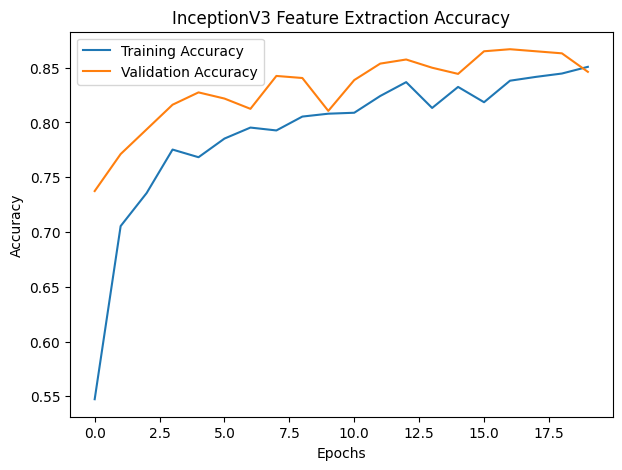

In [122]:
# Plot InceptionV3 training and validation accuracy
plt.figure(figsize=(7, 5))
plt.plot(inception_history.history["accuracy"], label="Training Accuracy")
plt.plot(inception_history.history["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("InceptionV3 Feature Extraction Accuracy")
plt.legend()
plt.show()

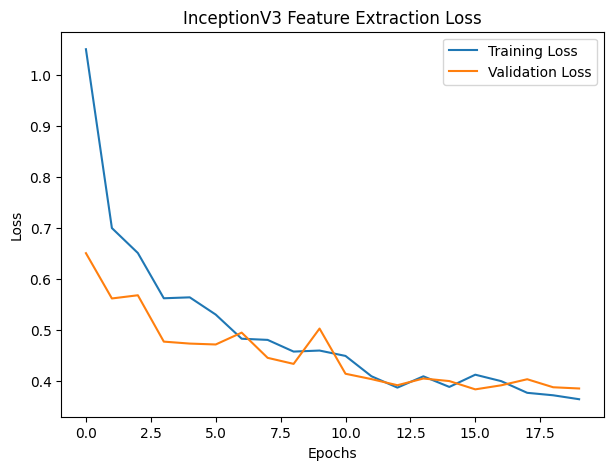

In [123]:
# Plot InceptionV3 training and validation loss
plt.figure(figsize=(7, 5))
plt.plot(inception_history.history["loss"], label="Training Loss")
plt.plot(inception_history.history["val_loss"], label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("InceptionV3 Feature Extraction Loss")
plt.legend()
plt.show()

In [128]:
# First, recreate the InceptionV3 test generator with correct settings
inception_test_generator = validation_datagen.flow_from_directory(
    test_path,
    target_size=(299, 299),  # InceptionV3 uses 299x299
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Generate predictions using InceptionV3 feature extraction model
inception_test_generator.reset()
y_pred_probabilities = inception_model.predict(inception_test_generator)
y_pred = np.argmax(y_pred_probabilities, axis=1)
y_true = inception_test_generator.classes
class_names = list(inception_test_generator.class_indices.keys())



Found 533 images belonging to 4 classes.
17/17 ━━━━━━━━━━━━━━━━━━━━ 20s 560ms/step


In [129]:
# Display classification report
print(classification_report(y_true, y_pred, target_names=class_names))

                  precision    recall  f1-score   support

    glioma_tumor       0.89      0.84      0.86       177
meningioma_tumor       0.80      0.85      0.83       144
          normal       0.83      0.79      0.81        48
 pituitary_tumor       0.92      0.93      0.92       164

        accuracy                           0.87       533
       macro avg       0.86      0.85      0.86       533
    weighted avg       0.87      0.87      0.87       533



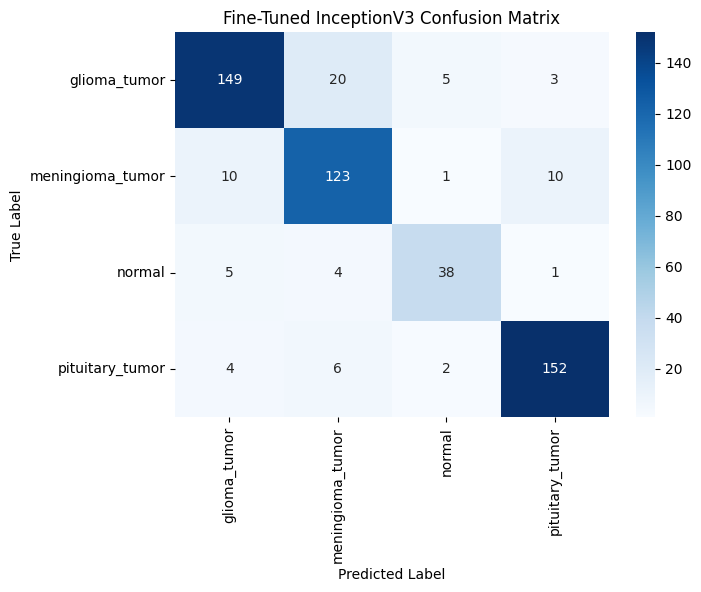

In [130]:
# Plot fine-tuned InceptionV3 confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(7, 5))
sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Fine-Tuned InceptionV3 Confusion Matrix")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step


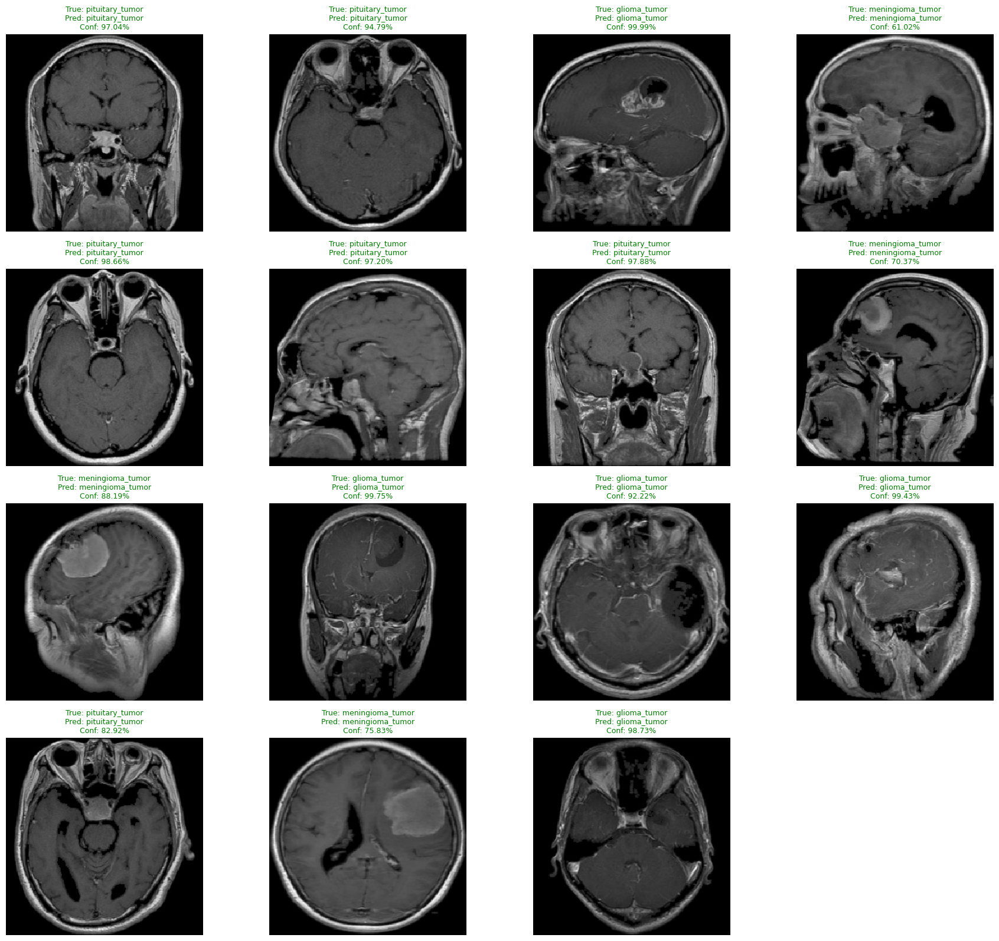

In [131]:
# Display sample predictions from fine-tuned InceptionV3 model
inception_test_generator.reset()

all_images = []
all_labels = []

for images, labels in inception_test_generator:
    all_images.append(images)
    all_labels.append(labels)
    if len(all_images) * batch_size >= inception_test_generator.samples:
        break

all_images = np.vstack(all_images)
all_labels = np.vstack(all_labels)

random_indices = np.random.choice(len(all_images), size=20, replace=False)
sample_images = all_images[random_indices]
sample_labels = all_labels[random_indices]

predictions = inception_model.predict(sample_images)

plt.figure(figsize=(18, 20))

for i in range(15):
    plt.subplot(5, 4, i + 1)
    image = sample_images[i]
    image = (image - image.min()) / (image.max() - image.min())
    plt.imshow(image)

    true_index = np.argmax(sample_labels[i])
    pred_index = np.argmax(predictions[i])
    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]
    confidence = predictions[i][pred_index] * 100

    title_color = "green" if true_index == pred_index else "red"

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

In [132]:
# Unfreeze last layers of InceptionV3 for fine-tuning
base_model.trainable = True

for layer in base_model.layers[:-30]:
    layer.trainable = False

print("Fine-tuning enabled for last InceptionV3 layers.")


Fine-tuning enabled for last InceptionV3 layers.


In [133]:
# Compile InceptionV3 model for fine-tuning
inception_model.compile(
    optimizer=Adam(learning_rate=0.00001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
print("InceptionV3 fine-tuning model compiled successfully.")


InceptionV3 fine-tuning model compiled successfully.


In [134]:
# Define checkpoint for fine-tuning phase
fine_tune_checkpoint = ModelCheckpoint(
    "inception_finetune_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

fine_tune_callbacks = [
    early_stopping,
    reduce_lr,
    fine_tune_checkpoint
]


In [135]:
# Train InceptionV3 fine-tuning model
fine_tune_history = inception_model.fit(
    inception_train_generator,
    epochs=15,
    validation_data=inception_validation_generator,
    class_weight=inception_class_weight_dict,
    callbacks=fine_tune_callbacks
)


Epoch 1/15
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.8287 - loss: 0.3607
Epoch 1: val_accuracy improved from None to 0.87054, saving model to inception_finetune_best_model.keras

Epoch 1: finished saving model to inception_finetune_best_model.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 86s 998ms/step - accuracy: 0.8429 - loss: 0.3531 - val_accuracy: 0.8705 - val_loss: 0.3867 - learning_rate: 1.0000e-05
Epoch 2/15
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 731ms/step - accuracy: 0.8579 - loss: 0.3503
Epoch 2: val_accuracy improved from 0.87054 to 0.87242, saving model to inception_finetune_best_model.keras

Epoch 2: finished saving model to inception_finetune_best_model.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 56s 779ms/step - accuracy: 0.8573 - loss: 0.3518 - val_accuracy: 0.8724 - val_loss: 0.3855 - learning_rate: 1.0000e-05
Epoch 3/15
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 701ms/step - accuracy: 0.8507 - loss: 0.3470
Epoch 3: val_accuracy did not improve from 0.87242
72/72 ━━━━━━━━━━━━━━━━━━━━ 53s 735ms/step - 

In [136]:
# Load best fine-tuned InceptionV3 model
inception_model = tf.keras.models.load_model("inception_finetune_best_model.keras")
print("Best fine-tuned InceptionV3 model loaded successfully.")


Best fine-tuned InceptionV3 model loaded successfully.


In [137]:
# Display best fine-tuning validation results
best_epoch = np.argmax(fine_tune_history.history["val_accuracy"]) + 1
best_val_accuracy = max(fine_tune_history.history["val_accuracy"])
best_val_loss = min(fine_tune_history.history["val_loss"])

print("Best Epoch:", best_epoch)
print("Best Validation Accuracy:", round(best_val_accuracy, 4))
print("Best Validation Loss:", round(best_val_loss, 4))


Best Epoch: 11
Best Validation Accuracy: 0.8762
Best Validation Loss: 0.3794


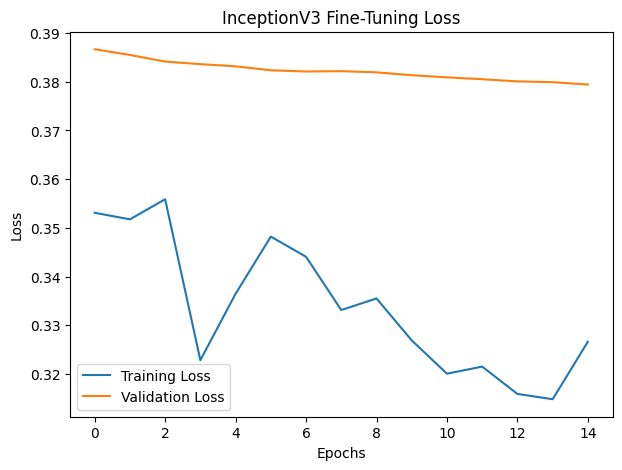

In [138]:
# Plot fine-tuning training and validation loss
plt.figure(figsize=(7, 5))
plt.plot(fine_tune_history.history["loss"], label="Training Loss")
plt.plot(fine_tune_history.history["val_loss"], label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("InceptionV3 Fine-Tuning Loss")
plt.legend()
plt.show()


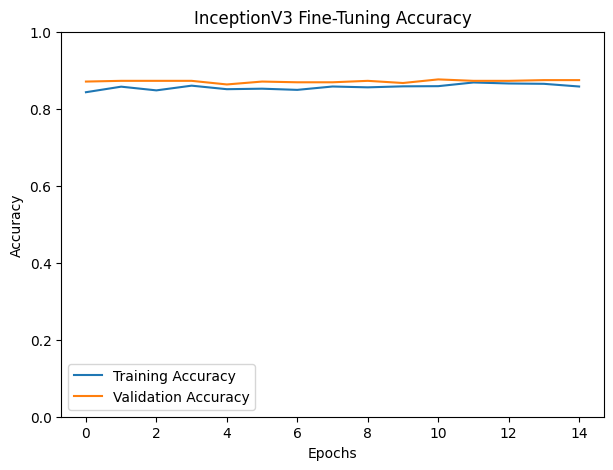

In [139]:
# Plot fine-tuning training and validation accuracy
plt.figure(figsize=(7, 5))
plt.plot(fine_tune_history.history["accuracy"], label="Training Accuracy")
plt.plot(fine_tune_history.history["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("InceptionV3 Fine-Tuning Accuracy")
plt.ylim(0, 1)
plt.legend()
plt.show()


In [140]:
# Generate predictions using fine-tuned InceptionV3 model
y_pred_probabilities = inception_model.predict(inception_test_generator)
y_pred = np.argmax(y_pred_probabilities, axis=1)
y_true = inception_test_generator.classes
class_names = list(inception_test_generator.class_indices.keys())


17/17 ━━━━━━━━━━━━━━━━━━━━ 17s 664ms/step


In [141]:
# Display classification report
print(classification_report(y_true, y_pred, target_names=class_names))

                  precision    recall  f1-score   support

    glioma_tumor       0.93      0.84      0.88       177
meningioma_tumor       0.81      0.85      0.83       144
          normal       0.83      0.81      0.82        48
 pituitary_tumor       0.90      0.96      0.93       164

        accuracy                           0.88       533
       macro avg       0.87      0.86      0.86       533
    weighted avg       0.88      0.88      0.88       533



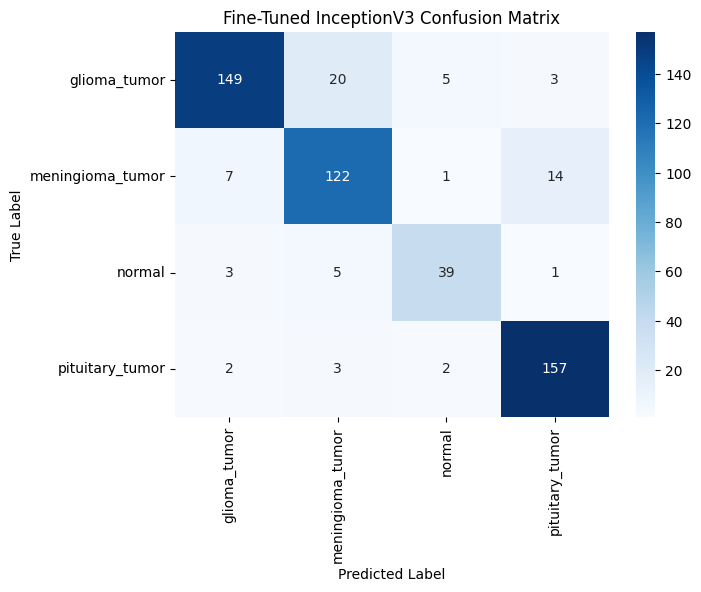

In [142]:
# Plot fine-tuned InceptionV3 confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(7, 5))
sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Fine-Tuned InceptionV3 Confusion Matrix")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


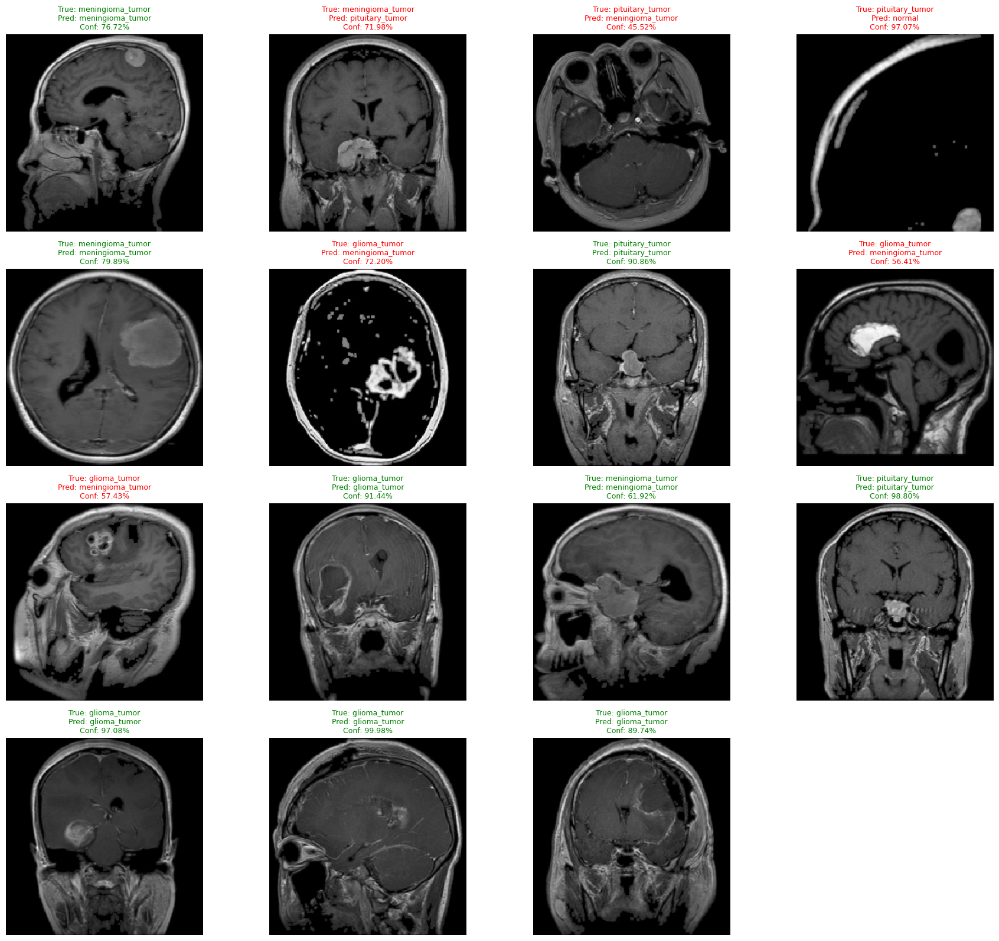

In [143]:
# Display sample predictions from fine-tuned InceptionV3 model
inception_test_generator.reset()

all_images = []
all_labels = []

for images, labels in inception_test_generator:
    all_images.append(images)
    all_labels.append(labels)
    if len(all_images) * batch_size >= inception_test_generator.samples:
        break

all_images = np.vstack(all_images)
all_labels = np.vstack(all_labels)

random_indices = np.random.choice(len(all_images), size=20, replace=False)
sample_images = all_images[random_indices]
sample_labels = all_labels[random_indices]

predictions = inception_model.predict(sample_images)

plt.figure(figsize=(18, 20))

for i in range(15):
    plt.subplot(5, 4, i + 1)
    image = sample_images[i]
    image = (image - image.min()) / (image.max() - image.min())
    plt.imshow(image)

    true_index = np.argmax(sample_labels[i])
    pred_index = np.argmax(predictions[i])
    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]
    confidence = predictions[i][pred_index] * 100

    title_color = "green" if true_index == pred_index else "red"

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )
    plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


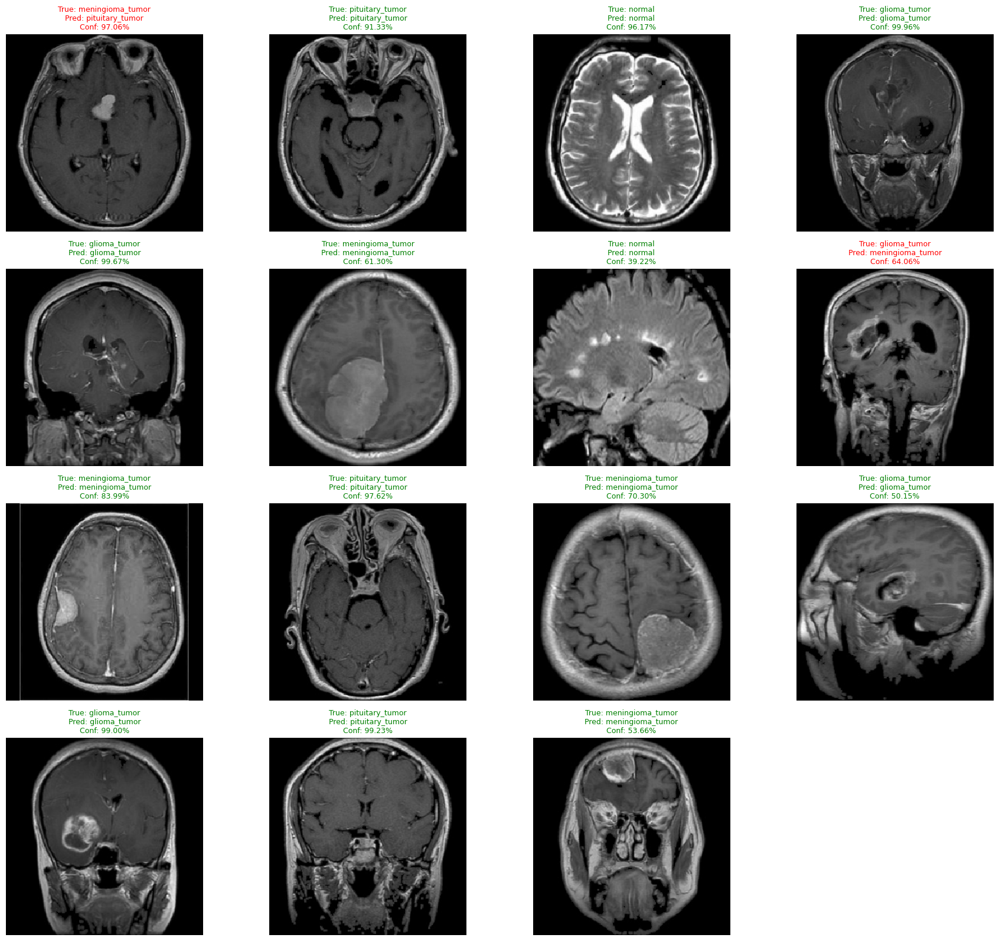

In [144]:
# Display sample predictions from fine-tuned InceptionV3 model
inception_test_generator.reset()

all_images = []
all_labels = []

for images, labels in inception_test_generator:
    all_images.append(images)
    all_labels.append(labels)
    if len(all_images) * batch_size >= inception_test_generator.samples:
        break

all_images = np.vstack(all_images)
all_labels = np.vstack(all_labels)

random_indices = np.random.choice(len(all_images), size=20, replace=False)
sample_images = all_images[random_indices]
sample_labels = all_labels[random_indices]

predictions = inception_model.predict(sample_images)

plt.figure(figsize=(18, 20))

for i in range(15):
    plt.subplot(5, 4, i + 1)
    image = sample_images[i]
    image = (image - image.min()) / (image.max() - image.min())
    plt.imshow(image)

    true_index = np.argmax(sample_labels[i])
    pred_index = np.argmax(predictions[i])
    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]
    confidence = predictions[i][pred_index] * 100

    title_color = "green" if true_index == pred_index else "red"

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )
    plt.axis("off")

plt.tight_layout()
plt.show()


In [145]:
# Compare all CNN and transfer learning models
final_transfer_comparison_df = pd.DataFrame({
    "Model": [
        "Baseline CNN",
        "Deeper CNN (Adam)",
        "Deeper CNN (SGD)",
        "Deeper CNN Without Dropout",
        "InceptionV3 Feature Extraction",
        "InceptionV3 Fine-Tuning"
    ],
    "Best Validation Accuracy": [
        max(baseline_history.history["val_accuracy"]),
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"]),
        max(inception_history.history["val_accuracy"]),
        max(fine_tune_history.history["val_accuracy"])
    ],
    "Best Validation Loss": [
        min(baseline_history.history["val_loss"]),
        min(deeper_history.history["val_loss"]),
        min(sgd_history.history["val_loss"]),
        min(ablation_history.history["val_loss"]),
        min(inception_history.history["val_loss"]),
        min(fine_tune_history.history["val_loss"])
    ]
})

final_transfer_comparison_df


,Model,Best Validation Accuracy,Best Validation Loss
0,Baseline CNN,0.739035,0.701126
1,Deeper CNN (Adam),0.324561,1.405334
2,Deeper CNN (SGD),0.333333,1.345787
3,Deeper CNN Without Dropout,0.504386,1.615679
4,InceptionV3 Feature Extraction,0.866792,0.383476
5,InceptionV3 Fine-Tuning,0.876173,0.379420


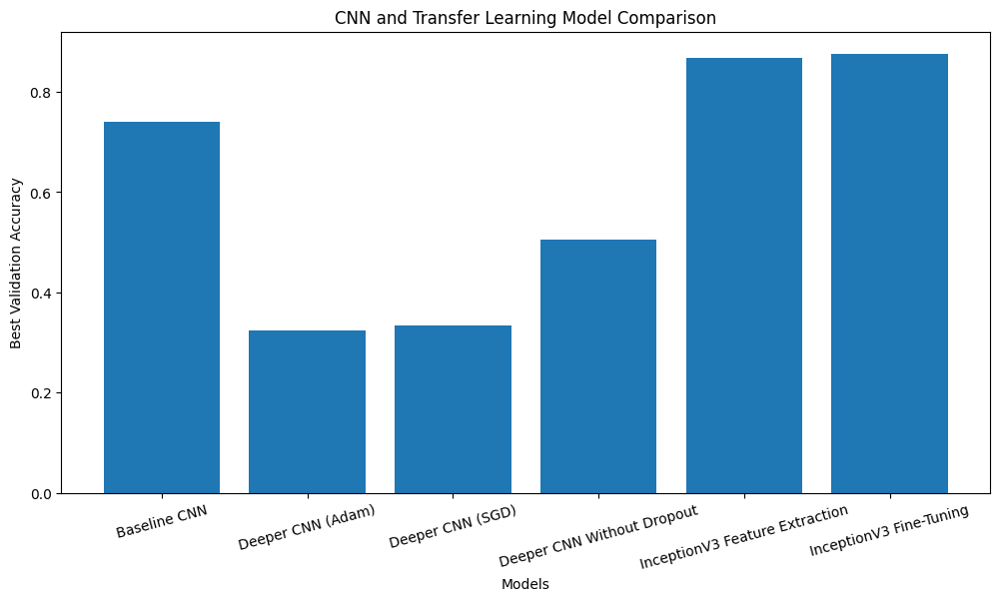

In [146]:
# Visualize final model comparison
plt.figure(figsize=(12, 6))
plt.bar(
    final_transfer_comparison_df["Model"],
    final_transfer_comparison_df["Best Validation Accuracy"]
)
plt.xticks(rotation=15)
plt.xlabel("Models")
plt.ylabel("Best Validation Accuracy")
plt.title("CNN and Transfer Learning Model Comparison")
plt.show()


In [147]:
# Save final transfer learning comparison table to Google Drive
final_transfer_comparison_df.to_csv(
    "/content/drive/MyDrive/AIfinal_learning_comparison.csv",
    index=False
)

print("Final transfer learning comparison saved to Google Drive successfully.")

Final transfer learning comparison saved to Google Drive successfully.


In [148]:
# Compare training and validation accuracy of all approaches
accuracy_comparison_df = pd.DataFrame({
    "Model": [
        "Baseline CNN",
        "Deeper CNN (Adam)",
        "Deeper CNN (SGD)",
        "Deeper CNN Without Dropout",
        "InceptionV3 Feature Extraction",
        "InceptionV3 Fine-Tuning"
    ],
    "Best Training Accuracy": [
        max(baseline_history.history["accuracy"]),
        max(deeper_history.history["accuracy"]),
        max(sgd_history.history["accuracy"]),
        max(ablation_history.history["accuracy"]),
        max(inception_history.history["accuracy"]),
        max(fine_tune_history.history["accuracy"])
    ],
    "Best Validation Accuracy": [
        max(baseline_history.history["val_accuracy"]),
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"]),
        max(inception_history.history["val_accuracy"]),
        max(fine_tune_history.history["val_accuracy"])
    ]
})

accuracy_comparison_df


,Model,Best Training Accuracy,Best Validation Accuracy
0,Baseline CNN,0.804360,0.739035
1,Deeper CNN (Adam),0.337875,0.324561
2,Deeper CNN (SGD),0.429428,0.333333
3,Deeper CNN Without Dropout,0.820708,0.504386
4,InceptionV3 Feature Extraction,0.850720,0.866792
5,InceptionV3 Fine-Tuning,0.868180,0.876173


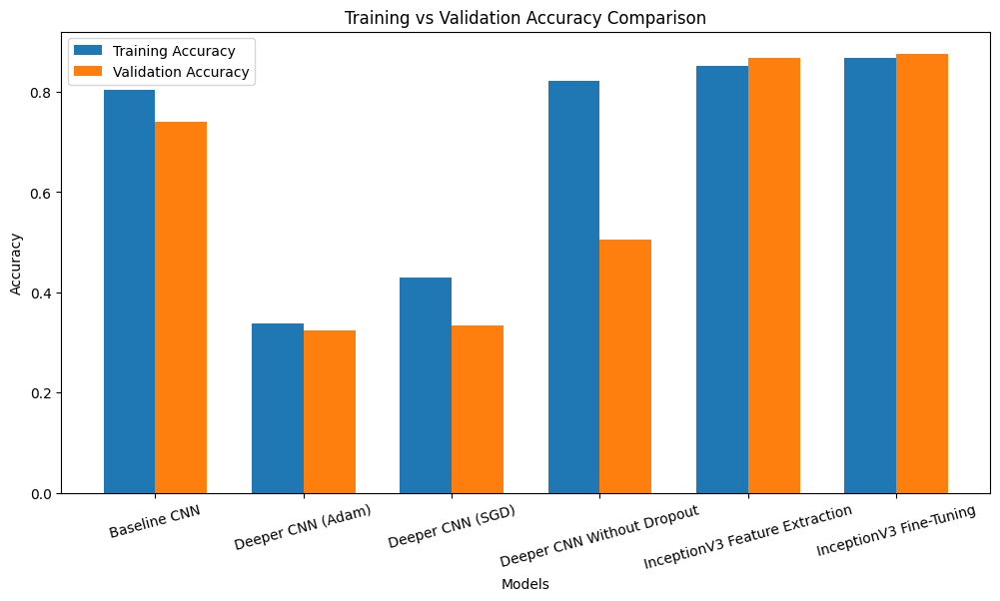

In [149]:
# Visualize training and validation accuracy comparison
x = np.arange(len(accuracy_comparison_df))
width = 0.35

plt.figure(figsize=(12, 6))
plt.bar(
    x - width / 2,
    accuracy_comparison_df["Best Training Accuracy"],
    width,
    label="Training Accuracy"
)
plt.bar(
    x + width / 2,
    accuracy_comparison_df["Best Validation Accuracy"],
    width,
    label="Validation Accuracy"
)
plt.xticks(x, accuracy_comparison_df["Model"], rotation=15)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy Comparison")
plt.legend()
plt.show()


In [150]:
# Save all training histories to Google Drive
pd.DataFrame(baseline_history.history).to_csv(
    "/content/drive/MyDrive/baseline_history.csv",
    index=False
)
pd.DataFrame(deeper_history.history).to_csv(
    "/content/drive/MyDrive/deeper_adam_history.csv",
    index=False
)
pd.DataFrame(sgd_history.history).to_csv(
    "/content/drive/MyDrive/deeper_sgd_history.csv",
    index=False
)
pd.DataFrame(ablation_history.history).to_csv(
    "/content/drive/MyDrive/ablation_history.csv",
    index=False
)
pd.DataFrame(inception_history.history).to_csv(
    "/content/drive/MyDrive/inception_feature_extraction_history.csv",
    index=False
)
pd.DataFrame(fine_tune_history.history).to_csv(
    "/content/drive/MyDrive/inception_finetune_history.csv",
    index=False
)
print("All training histories saved successfully.")


All training histories saved successfully.
